In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
import os

img_folder_path = '/content/drive/My Drive/Satellite data/data_processed/test'
dirListing = os.listdir(img_folder_path)

print(len(dirListing))

7325


In [2]:
cd 'drive/My Drive/Satellite data'

/content/drive/My Drive/Satellite data


In [0]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [0]:
from fastai.vision import *
from fastai.metrics import error_rate
from fastai.callbacks import SaveModelCallback

In [0]:
np.random.seed(2)

In [0]:
data = ImageDataBunch.from_folder('/content/drive/My Drive/Satellite data/data_processed/train',train='', test = '/content/drive/My Drive/Satellite data/data_processed/test',valid_pct = 0.2,  ds_tfms=get_transforms(flip_vert=True, max_lighting=0.1, max_zoom=1.05, max_warp=0.), 
                              size=224, bs=32).normalize(imagenet_stats)

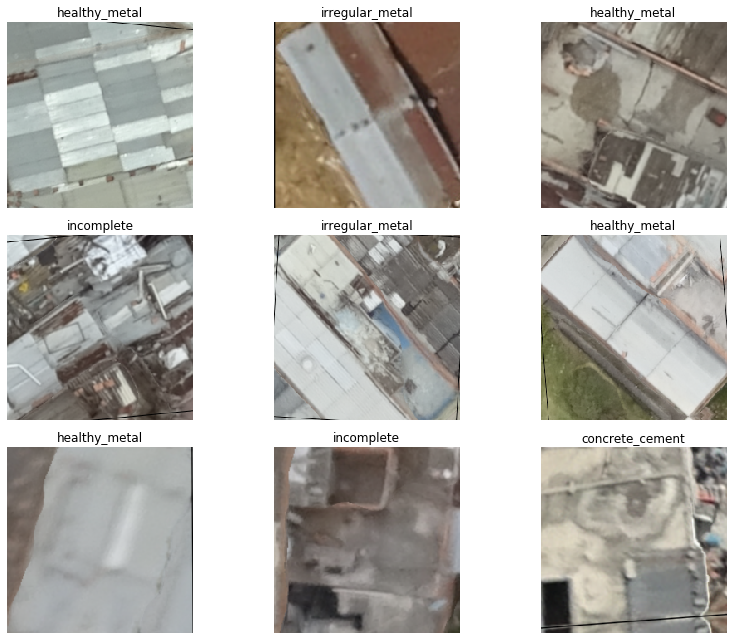

In [7]:
data.show_batch(rows=3, figsize=(12,9))

In [8]:
print(data.classes)
#data.save('databunch1')

['concrete_cement', 'healthy_metal', 'incomplete', 'irregular_metal', 'other']


In [9]:
learn = cnn_learner(data, models.resnet152, metrics=error_rate)

Downloading: "https://download.pytorch.org/models/resnet152-b121ed2d.pth" to /root/.cache/torch/checkpoints/resnet152-b121ed2d.pth
100%|██████████| 230M/230M [00:03<00:00, 70.9MB/s]


In [0]:
learn.load('39th_position_model')

Learner(data=ImageDataBunch;

Train: LabelList (11896 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: CategoryList
concrete_cement,concrete_cement,concrete_cement,concrete_cement,concrete_cement
Path: /content/drive/My Drive/Satellite data/data_processed/train;

Valid: LabelList (2974 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: CategoryList
incomplete,irregular_metal,irregular_metal,healthy_metal,incomplete
Path: /content/drive/My Drive/Satellite data/data_processed/train;

Test: LabelList (7325 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: EmptyLabelList
,,,,
Path: /content/drive/My Drive/Satellite data/data_processed/train, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): Bat

In [10]:
learn.model

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(64, 256

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 8.32E-04
Min loss divided by 10: 7.59E-04


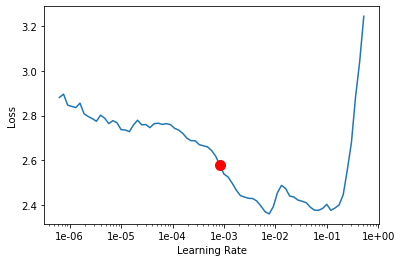

In [11]:
learn.lr_find()
learn.recorder.plot(suggestion=True)

In [12]:
learn.fit_one_cycle(4, max_lr =8e-04 ,callbacks=[SaveModelCallback(learn)])

epoch,train_loss,valid_loss,error_rate,time
0,1.214420,0.835698,0.270343,04:44
1,0.743595,0.604935,0.226631,04:44
2,0.632457,0.529155,0.208810,04:44
3,0.588175,0.508229,0.193006,04:43


Better model found at epoch 0 with valid_loss value: 0.8356976509094238.
Better model found at epoch 1 with valid_loss value: 0.6049346327781677.
Better model found at epoch 2 with valid_loss value: 0.5291549563407898.
Better model found at epoch 3 with valid_loss value: 0.5082289576530457.


In [0]:
learn.save('stage-1 v1 -152')

In [0]:
learn.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 1.32E-06
Min loss divided by 10: 7.59E-06


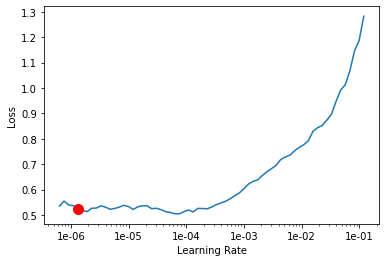

In [17]:
learn.lr_find()
learn.recorder.plot(suggestion=True)

In [22]:
learn.fit_one_cycle(2, max_lr=slice(8e-06, 1e-05),callbacks=[SaveModelCallback(learn)])

epoch,train_loss,valid_loss,error_rate,time
0,0.472329,0.477042,0.183255,06:15
1,0.465180,0.475009,0.182246,06:17


Better model found at epoch 0 with valid_loss value: 0.47704192996025085.
Better model found at epoch 1 with valid_loss value: 0.4750092923641205.


In [23]:
learn.load('res152-unfreeze2')

Learner(data=ImageDataBunch;

Train: LabelList (11896 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
concrete_cement,concrete_cement,concrete_cement,concrete_cement,concrete_cement
Path: /content/drive/My Drive/Satellite data/data_processed/train;

Valid: LabelList (2974 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
incomplete,irregular_metal,irregular_metal,healthy_metal,incomplete
Path: /content/drive/My Drive/Satellite data/data_processed/train;

Test: LabelList (7325 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: EmptyLabelList
,,,,
Path: /content/drive/My Drive/Satellite data/data_processed/train, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): Bat

In [24]:
img = learn.data.test_ds[0][0]
print(np.array(learn.predict(img)[2]))

[7.815859e-04 9.763282e-01 1.520820e-03 2.113338e-02 2.360749e-04]


In [0]:
img = learn.data.test_ds[0][0]
print(np.array(learn.predict(img)[2]))

[0.001101 0.951622 0.001569 0.043806 0.001902]


In [0]:
preds, y = learn.get_preds(DatasetType.Test)

In [0]:
import pandas as pd
df_test = pd.read_csv('testResults.csv')

In [0]:
df_test.head()

,id,concrete_cement,healthy_metal,incomplete,irregular_metal,other
0,7a4d630a,0.000381,0.996386,0.000005,0.003127,0.000101
1,7a4bbbd6,0.020826,0.937957,0.004498,0.027691,0.009029
2,7a4ac744,0.004408,0.679267,0.007258,0.308397,0.000670
3,7a4881fa,0.000219,0.310672,0.000530,0.688543,0.000035
4,7a4aa4a8,0.004629,0.837616,0.001111,0.156469,0.000176


In [26]:
for i in range(len(df_test)):
    img = open_image('data_processed/test/'+df_test['id'][i]+'.tif')
    ar = np.array(learn.predict(img)[2])
    df_test['concrete_cement'][i] = ar[0]
    df_test['healthy_metal'][i] = ar[1]
    df_test['incomplete'][i] = ar[2]
    df_test['irregular_metal'][i] = ar[3]
    df_test['other'][i] = ar[4]

df_test.to_csv('submission3.csv')


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: Setti